# Feature Selection:


Feature selection is a process of selecting a subset of relevant features or variables from a larger set of features that are available in a dataset. It is done to improve the performance of a machine-learning model by reducing the complexity of the data and preventing overfitting. The main objective of feature selection is to remove irrelevant, redundant, or noisy features that do not contribute significantly to the predictive accuracy of the model while retaining the most important features that capture the underlying patterns in the data.


In [ ]:
# In this project we are using Filter methods( based on KS score and Fraud detection@ #% ) and Wrapper for 
# selection of top 25 variables depending upon their filter score and multivariate importance
#(Using multivariate importance in a wrapper method can help to identify the most important features
#for a particular problem, taking into account their interactions and joint contribution to the model output.)


This feature selection notebook does a filter followed by a wrapper for a binary dependent variable (binary classification). 


In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import pandas as pd
import numpy as np
import scipy.stats as sps
import matplotlib.pyplot as plt
import datetime as dt
import gc
from sklearn.ensemble import RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from lightgbm import LGBMClassifier
%matplotlib inline
start_time = dt.datetime.now()

In [6]:
# set some parameters
num_files = 1
# I recommend set num_filter to be about 10 to 20% of the original # variables
num_filter = 240 
# I recommend set num_wrapper to be about 50, then look for a saturation of the model performance as variables are added
# Then you can run it again with num_wrapper just a bit above this saturation point, not more than about twice this saturation number
num_wrapper = 25
balance = 0
detect_rate = .03
index_name = 'record'
y_name = 'fraud_label'
good_label = 0
bad_label = 1


## Run a filter on all the files

In [ ]:
# Aim of using filter is to figure out how imporant each. variable is by itself to predict y.
## using filter method to filter top 240 variables based on KS Score

In [7]:
%%time
filter_score_df_list = []
for i in range(num_files):
#     file_name = "vars"+str(i+1)+'.csv'
    file_name = 'vars.csv'
    df = pd.read_csv(file_name)
    print("********** working on",file_name,"size is",df.shape)
    df = df.set_index(index_name) 
    df = df[df.index <= 833507] # remove the last two months as the out-of-time data (OOT)
    df = df[df.index >= 38511] # remove the first 2 weeks of records since their variables aren't well formed
    df['RANDOM'] = np.random.ranf(len(df)) # add a random number variable to make sure it doesn't come up as important
    goods = df[df[y_name] == good_label]
    bads = df[df[y_name] == bad_label]
    del df # don't need this file anymore
    num_goods = len(goods)
    num_bads = len(bads)
    num_vars = len(bads.columns)-2
    if(balance != 0):
        if(i == 0):
            num_goods_desired = int(min(num_goods,num_bads*balance))
            goods = goods.sample(n=num_goods_desired,random_state=1)
            goods_keep = list(goods.index)
            goods_keep.sort()
    
        if(i > 0):
            goods = goods.loc[goods_keep] 
            
    df_sampled = pd.concat([goods,bads])
    df_sampled.sort_index(inplace=True)
    filter_score = pd.DataFrame(np.zeros((num_vars+1,2)))
    filter_score.columns = ['variable','filter score']   
    j = 0
    for column in df_sampled:
        filter_score.loc[j,'variable'] = column
        filter_score.loc[j,'filter score'] = sps.ks_2samp(goods[column],bads[column])[0]
        j = j+1
        if j%100 == 0:
            print(j)

    filter_score.sort_values(by=['filter score'], ascending=False, inplace=True)
    vars_keep = list(filter_score['variable'][1:num_filter+1]) 
    print(file_name,filter_score.head(20))
    if(i == 0): # if first time through need to initialize some stuff
        Y = pd.DataFrame(df_sampled[y_name], index=df_sampled.index)
        df_top = df_sampled.filter(vars_keep, axis=1)
            
    if(i > 0): # if more than one variable file we use this loop
        data_new_top = df_sampled.filter(vars_keep, axis=1)
        df_top = pd.concat([df_top,data_new_top], axis=1)

    filter_score_df_list.append(filter_score)
    
    del goods # delete these before starting the next file, if any
    del bads
    gc.collect()
filter_score = pd.concat(filter_score_df_list)

********** working on vars.csv size is (1000000, 2242)
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
vars.csv                                             variable  filter score
0                                        fraud_label      1.000000
2128                     max_count_by_fulladdress_30      0.359914
2108                         max_count_by_address_30      0.359215
2107                          max_count_by_address_7      0.343335
2127                      max_count_by_fulladdress_7      0.343052
10                                 address_day_since      0.334140
45                             fulladdress_day_since      0.333269
16                                  address_count_30      0.332648
51                              fulladdress_count_30      0.331969
2126                      max_count_by_fulladdress_3      0.329538
2106                          max_count_by_address_3      0.329445
15                             

In [8]:
filter_score.sort_values(by=['filter score'], ascending=False, inplace=True)
filter_score.reset_index(drop=True,inplace=True)

In [9]:
filter_score.head(30)

,variable,filter score
0,fraud_label,1.000000
1,max_count_by_fulladdress_30,0.359914
2,max_count_by_address_30,0.359215
3,max_count_by_address_7,0.343335
4,max_count_by_fulladdress_7,0.343052
5,address_day_since,0.334140
6,fulladdress_day_since,0.333269
7,address_count_30,0.332648
8,fulladdress_count_30,0.331969
9,max_count_by_fulladdress_3,0.329538


In [9]:
filter_score.shape

(2242, 2)

In [10]:
filter_score.to_csv('filter_full.csv')

In [36]:
filter_score.to_csv('filter_full_new.csv', index=False)

In [11]:
filter_score.head(80).to_csv('filter_top.csv')
vars_keep = list(filter_score['variable'][num_files:num_filter+3])
print(i,' vars_keep:',vars_keep)

0  vars_keep: ['max_count_by_fulladdress_30', 'max_count_by_address_30', 'max_count_by_address_7', 'max_count_by_fulladdress_7', 'address_day_since', 'fulladdress_day_since', 'address_count_30', 'fulladdress_count_30', 'max_count_by_fulladdress_3', 'max_count_by_address_3', 'address_count_14', 'fulladdress_count_14', 'max_count_by_address_1', 'max_count_by_fulladdress_1', 'address_count_7', 'fulladdress_count_7', 'address_unique_count_for_name_homephone_60', 'address_count_0_by_30', 'address_unique_count_for_homephone_name_dob_60', 'fulladdress_count_0_by_30', 'fulladdress_unique_count_for_ssn_homephone_60', 'address_unique_count_for_ssn_zip5_60', 'address_unique_count_for_ssn_name_60', 'fulladdress_unique_count_for_name_homephone_60', 'address_unique_count_for_ssn_homephone_60', 'fulladdress_unique_count_for_homephone_name_dob_60', 'fulladdress_unique_count_for_dob_homephone_60', 'address_unique_count_for_ssn_firstname_60', 'address_unique_count_for_ssn_name_dob_60', 'address_unique_c

In [12]:
### keeping top 240 variables  based on KS score

vars_keep_df = pd.DataFrame({'col':vars_keep})
vars_keep_df.to_csv('vars_keep_filter.csv',index=False)
df_keep = df_top.filter(vars_keep, axis=1)
df_keep.head()

,max_count_by_fulladdress_30,max_count_by_address_30,max_count_by_address_7,max_count_by_fulladdress_7,address_day_since,fulladdress_day_since,address_count_30,fulladdress_count_30,max_count_by_fulladdress_3,max_count_by_address_3,...,zip5_unique_count_for_dob_homephone_3,zip5_unique_count_for_homephone_name_dob_3,zip5_unique_count_for_name_homephone_3,zip5_unique_count_for_ssn_dob_3,zip5_unique_count_for_ssn_name_dob_3,zip5_unique_count_for_dob_3,zip5_unique_count_for_ssn_3,zip5_unique_count_for_ssn_lastname_3,zip5_unique_count_for_ssn_firstname_3,zip5_unique_count_for_ssn_name_3
record,,,,,,,,,,,,,,,,,,,,,
38511,14,14,10,10,0.0,0.0,12,12,6,6,...,4,4,4,4,4,4,4,4,4,4
38512,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
38513,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
38514,1,1,1,1,365.0,365.0,1,1,1,1,...,2,2,2,2,2,2,2,2,2,2
38515,1,1,1,1,365.0,365.0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [13]:
df_keep.shape

(794997, 240)

In [22]:
Y['fraud_label']=Y['fraud_label'].astype(int)

In [23]:
Y.head()

,fraud_label
record,
38511,1
38512,0
38513,0
38514,0
38515,0


In [24]:
Y = Y.values
Y_save = Y.copy()

In [25]:
# Y = np.array(Y)
X = df_keep
print(Y)

[[1]
 [0]
 [0]
 ...
 [0]
 [0]
 [0]]


In [26]:
print('time to here:', dt.datetime.now() - start_time)

time to here: 0:18:04.728554


In [27]:
print(X.shape,Y.shape)

(794997, 240) (794997, 1)


In [28]:
print(type(X),type(Y))

<class 'pandas.core.frame.DataFrame'> <class 'numpy.ndarray'>


In [ ]:
## will setup FDR@3 % 
#the FDR (Fraud Detection Rate) indicates the percentage of all detected frauds at a 
#specific threshold level. For instance, if the FDR is 55% at a 3% threshold, it means that
#the model can detect 55% of all frauds within 3% of the total population.

In [30]:
def fdr(classifier, x, y, cutoff=detect_rate):
# Calculates FDR score for the given classifier on dataset x and y with cutoff value
# get the probability list from the given classifier
    return fdr_prob(y, classifier.predict_proba(x), cutoff)
def fdr_prob(y, y_prob, cutoff=detect_rate):
    if len(y_prob.shape) != 1:    # sometimes the probability list can contain many columns, one for each category
        y_prob = y_prob[:, -1:]   # only the last one (fraud_label==1) is used here.
    num_fraud = len(y[y == 1])    # count the total nunber of frauds   
# sort the proba list from high to low while retain the true (not predicted) fraud label
    sorted_prob = np.asarray(sorted(zip(y_prob, y), key=lambda x: x[0], reverse=True))
    cutoff_bin = sorted_prob[0:int(len(y) * cutoff), 1:]  # 3% cutoff
# return the FDR score (#fraud_in_cutoff / #total_fraud)
    return len(cutoff_bin[cutoff_bin == 1]) / num_fraud   

## Run a wrapper on the remaining top variables

In [ ]:
# Selection top 25 features sorted by their multivariate importance

Wrapper forward selection is a feature selection technique that involves building a model with a subset of the available features and evaluating its performance. The wrapper forward selection algorithm selects the best subset of features by iteratively adding one feature at a time to the model until the performance improvement reaches a threshold or no further improvement is possible.

In [31]:
%%time
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning) 
# If you're doing forward selection it's enough to stop at num_wrapper variables. 
# If you're doing backward selection you need to go through all the variables to get a sorted list of num_wrapper variables.


nfeatures = len(X.columns)
# clf = RandomForestClassifier(n_estimators=5) # simple, fast nonlinear model for the wrapper
clf = LGBMClassifier(n_estimators=20,num_leaves=3) # simple, fast nonlinear model for the wrapper
sfs = SFS(clf,k_features=num_wrapper,forward=True,verbose=0,scoring=fdr,cv=3,n_jobs=-1) # use for forward selection
# sfs = SFS(clf,k_features=1,forward=False,verbose=0,scoring=fdr,cv=3,n_jobs=-1) # use for backward selection
sfs.fit(X,Y)


/Users/ayushbhardwaj/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ayushbhardwaj/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ayushbhardwaj/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ayushbhardwaj/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vect

CPU times: user 40.3 s, sys: 34.2 s, total: 1min 14s
Wall time: 1h 13min 54s


SequentialFeatureSelector(cv=3,
                          estimator=LGBMClassifier(n_estimators=20,
                                                   num_leaves=3),
                          k_features=(25, 25), n_jobs=-1,
                          scoring=<function fdr at 0x7f78681ebe50>)

In [32]:
print('time to here:', dt.datetime.now() - start_time)

time to here: 1:43:07.923953


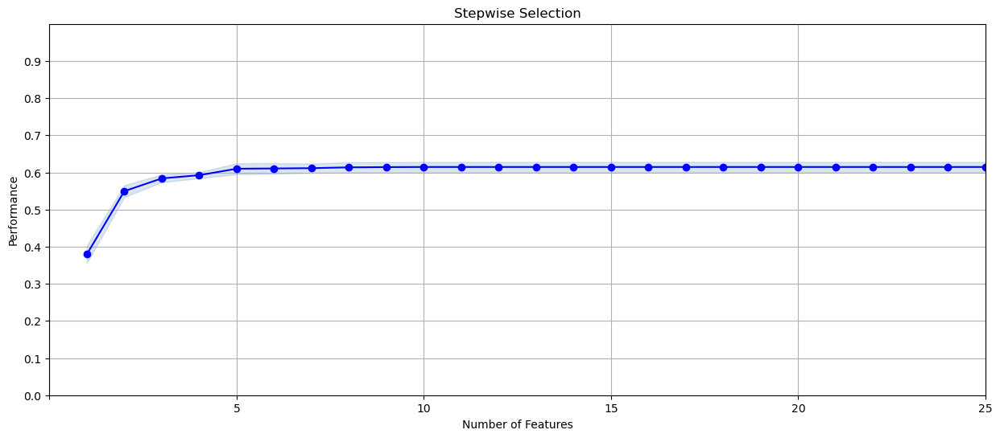

In [33]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig1 = plot_sfs(sfs.get_metric_dict(),kind='std_dev', figsize=(15, 6))
plt.xticks(np.arange(0, len(X.columns), step=5))
plt.yticks(np.arange(0,1,step=.1))
plt.ylim([0., 1])
plt.xlim(0,num_wrapper)
plt.title('Stepwise Selection')
plt.grid()
plt.savefig('performance_nvars.png')
plt.show()

In [34]:
vars_FS = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

In [41]:
ordered_vars_FS = vars_FS.copy()
for i in range(len(ordered_vars_FS)):
    ordered_vars_FS.loc[i+1,'add variables in this order'] = int(i+1)
    if i+1 == 1:
        ordered_vars_FS.loc[i+1,'variable name'] = (list(ordered_vars_FS.loc[i+1,'feature_names'])[0])
    else:
        ordered_vars_FS.loc[i+1,'variable name'] = (list(set(ordered_vars_FS.loc[i+1,'feature_names']) - set(ordered_vars_FS.loc[i,'feature_names']))[0])
# You might also need this following line. It converts a list to a string
        #         ordered_vars_FS.loc[i+1,'variable name'] = ordered_vars_FS.loc[i+1,'variable name'][0]
    
    
    


In [42]:
ordered_vars_FS

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,add variables in this order,variable name
1,"(1,)","[0.35361713241055104, 0.41028989292243406, 0.3...",0.379647,"(max_count_by_address_30,)",0.05258,0.023365,0.016522,1.0,max_count_by_address_30
2,"(1, 205)","[0.5270305562810134, 0.5620266388090885, 0.559...",0.549491,"(max_count_by_address_30, max_count_by_ssn_dob_7)",0.03582,0.015917,0.011255,2.0,max_count_by_ssn_dob_7
3,"(1, 205, 225)","[0.5701227474536432, 0.5949334029772787, 0.586...",0.583877,"(max_count_by_address_30, max_count_by_ssn_dob...",0.023194,0.010307,0.007288,3.0,max_count_by_homephone_3
4,"(0, 1, 205, 225)","[0.5821363280229825, 0.6022460172368764, 0.593...",0.592496,"(max_count_by_fulladdress_30, max_count_by_add...",0.0185,0.008221,0.005813,4.0,max_count_by_fulladdress_30
5,"(0, 1, 205, 225, 226)","[0.5891877774875947, 0.6192217289109428, 0.621...",0.609907,"(max_count_by_fulladdress_30, max_count_by_add...",0.033024,0.014675,0.010377,5.0,zip5_count_3
6,"(0, 1, 192, 205, 225, 226)","[0.5902324366675372, 0.6192217289109428, 0.622...",0.610603,"(max_count_by_fulladdress_30, max_count_by_add...",0.032542,0.014461,0.010226,6.0,max_count_by_ssn_dob_30
7,"(0, 1, 192, 199, 205, 225, 226)","[0.5938887437973361, 0.6213110472708279, 0.618...",0.611387,"(max_count_by_fulladdress_30, max_count_by_add...",0.027927,0.01241,0.008775,7.0,max_count_by_homephone_7
8,"(0, 1, 19, 192, 199, 205, 225, 226)","[0.5944110733873074, 0.6252285191956124, 0.621...",0.61365,"(max_count_by_fulladdress_30, max_count_by_add...",0.030825,0.013698,0.009686,8.0,fulladdress_count_0_by_30
9,"(0, 1, 19, 159, 192, 199, 205, 225, 226)","[0.5957168973622355, 0.6257508487855837, 0.621...",0.61426,"(max_count_by_fulladdress_30, max_count_by_add...",0.029786,0.013236,0.00936,9.0,max_count_by_fulladdress_homephone_30
10,"(0, 1, 19, 159, 192, 199, 204, 205, 225, 226)","[0.5954557325672499, 0.6254896839905981, 0.622...",0.614608,"(max_count_by_fulladdress_30, max_count_by_add...",0.03057,0.013584,0.009606,10.0,ssn_dob_day_since


In [43]:
ordered_vars_FS.to_csv('Wrapper_selection_info.csv', index=False)

In [44]:
vars_keep = ordered_vars_FS['variable name']
vars_keep_list = ordered_vars_FS['variable name'].tolist()
vars_keep.to_csv('final_vars_list.csv',index=False)
vars_keep

1                            max_count_by_address_30
2                             max_count_by_ssn_dob_7
3                           max_count_by_homephone_3
4                        max_count_by_fulladdress_30
5                                       zip5_count_3
6                            max_count_by_ssn_dob_30
7                           max_count_by_homephone_7
8                          fulladdress_count_0_by_30
9              max_count_by_fulladdress_homephone_30
10                                 ssn_dob_day_since
11                            max_count_by_address_7
12                                 address_day_since
13                             fulladdress_day_since
14                        max_count_by_fulladdress_3
15                            max_count_by_address_3
16                                  address_count_14
17                              fulladdress_count_14
18                            max_count_by_address_1
19                        max_count_by_fulladd

In [45]:
filter_score.set_index('variable',drop=True,inplace=True)
filter_score = filter_score.iloc[1:,:]
filter_score

,filter score
variable,
max_count_by_fulladdress_30,0.359914
max_count_by_address_30,0.359215
max_count_by_address_7,0.343335
max_count_by_fulladdress_7,0.343052
address_day_since,0.334140
...,...
ssn_zip5_unique_count_for_address_14,0.000002
ssn_lastname_unique_count_for_name_0,0.000001
name_fulladdress_unique_count_for_zip5_30,0.000001


In [46]:
filter_score.shape

(2241, 1)

In [47]:
vars_keep_sorted = pd.DataFrame(vars_keep_list)
vars_keep_sorted.columns=['variable']
vars_keep_sorted.set_index('variable',drop=True,inplace=True)
vars_keep_sorted.head()

""
variable
max_count_by_address_30
max_count_by_ssn_dob_7
max_count_by_homephone_3
max_count_by_fulladdress_30
zip5_count_3


In [53]:
vars_keep_sorted = pd.concat([vars_keep_sorted,filter_score],axis=1,join='inner')

In [54]:
vars_keep_sorted.reset_index(inplace=True)
vars_keep_sorted.reset_index(inplace=True)
vars_keep_sorted['index'] = vars_keep_sorted['index'] + 1
vars_keep_sorted.rename(columns={'index':'wrapper order'},inplace=True)
vars_keep_sorted.to_csv('vars_keep_sorted.csv',index=False)
vars_keep_sorted

,wrapper order,variable,filter score
0,1,max_count_by_address_30,0.359215
1,2,max_count_by_ssn_dob_7,0.228401
2,3,max_count_by_homephone_3,0.224757
3,4,max_count_by_fulladdress_30,0.359914
4,5,zip5_count_3,0.224706
5,6,max_count_by_ssn_dob_30,0.240836
6,7,max_count_by_homephone_7,0.232235
7,8,fulladdress_count_0_by_30,0.290722
8,9,max_count_by_fulladdress_homephone_30,0.249724
9,10,ssn_dob_day_since,0.228626


In [55]:
vars_keep_list.append(index_name)
vars_keep_list.append(y_name)
vars_keep_list

['max_count_by_address_30',
 'max_count_by_ssn_dob_7',
 'max_count_by_homephone_3',
 'max_count_by_fulladdress_30',
 'zip5_count_3',
 'max_count_by_ssn_dob_30',
 'max_count_by_homephone_7',
 'fulladdress_count_0_by_30',
 'max_count_by_fulladdress_homephone_30',
 'ssn_dob_day_since',
 'max_count_by_address_7',
 'address_day_since',
 'fulladdress_day_since',
 'max_count_by_fulladdress_3',
 'max_count_by_address_3',
 'address_count_14',
 'fulladdress_count_14',
 'max_count_by_address_1',
 'max_count_by_fulladdress_1',
 'address_count_7',
 'fulladdress_count_7',
 'address_unique_count_for_name_homephone_60',
 'address_count_0_by_30',
 'address_unique_count_for_homephone_name_dob_60',
 'fulladdress_unique_count_for_ssn_homephone_60',
 'record',
 'fraud_label']

In [57]:
%%time
df = pd.read_csv(file_name)
df.shape

CPU times: user 2min 20s, sys: 46.1 s, total: 3min 6s
Wall time: 3min 32s


(1000000, 2242)

In [58]:
df_keep = df.filter(vars_keep_list, axis=1)
# df_keep = df[df.index.isin(vars_keep_list)]
print(df_keep.shape)

(1000000, 27)


In [59]:
df_keep.to_csv('vars_final.csv',index=False)

In [60]:
print("duration: ", dt.datetime.now() - start_time)

duration:  3:55:20.641749
